<a href="https://colab.research.google.com/github/tchauffi/diffusion/blob/main/denoising_diffusion_model_ffhq.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [7]:
!mkdir /content/data

In [8]:
!unzip -q /content/drive/MyDrive/Datascience/datasets/flickrfaceshq-dataset-ffhq.zip -d /content/data/ffhq

In [9]:
import tensorflow as tf

import tensorflow_datasets as tfds

import matplotlib.pyplot as plt

## HPs

In [10]:
IMG_SIZE = 64 #@param
BATCH_SIZE = 64 #@param
LEARNING_RATE = 1e-3 #@param
WEIGHT_DECAY = 1e-4 #@param
EPOCHS = 25 #@param
EMA = 0.999 #@param
N_REPEAT = 5 #@param


PLOT_DIFFUSION_STEPS = 20

AUTOTUNE = tf.data.AUTOTUNE

## Load dataset

In [42]:
dataset = tf.keras.utils.image_dataset_from_directory(
    "/content/data",
    batch_size=None,
    image_size=(IMG_SIZE, IMG_SIZE),
    class_names=None,
    )

def resize_and_rescale(image):
    image = tf.image.random_flip_left_right(image)
    image = tf.cast(image, tf.float32) / 255.0
    return image


dataset = dataset.map(lambda x, y : resize_and_rescale(x), num_parallel_calls=AUTOTUNE)
dataset = dataset.batch(BATCH_SIZE, drop_remainder=True)

Found 52001 files belonging to 1 classes.


In [43]:
img = next(iter(dataset))

In [44]:
len(dataset)

812

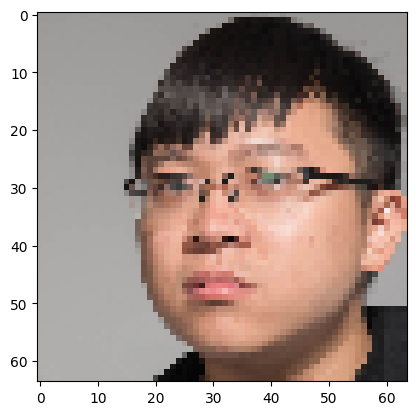

In [45]:
plt.imshow(img[2])
plt.show()

# Implement diffusion

## Diffusion scheduler implementation
Here we implement 3 kind of noise scheduller:
- a linear scheduler
- a cosine scheduler
- an offset cosine scheduler

From

In [14]:
def linear_diffusion_schedule(diffusion_times):
    min_rate = .0001
    max_rate = .02
    betas = min_rate + tf.convert_to_tensor(diffusion_times) * (max_rate - min_rate)
    alphas = 1 - betas
    alphas_bars = tf.math.cumprod(alphas)
    signal_rates = alphas_bars
    noise_rates =  1 - alphas_bars
    return noise_rates, signal_rates


In [15]:
import math

In [16]:
def cosine_diffusion_schedule(diffusion_times):
    signal_rates = tf.cos(diffusion_times * tf.constant(math.pi) / 2)
    noise_rates = tf.sin(diffusion_times * tf.constant(math.pi) / 2)
    return noise_rates, signal_rates

def offset_cosine_diffusion_schedule(diffusion_times):
    min_signal_rate = .02
    max_signal_rate = .95
    start_angle = tf.acos(max_signal_rate)
    end_angle = tf.acos(min_signal_rate)

    diffusion_angles = start_angle + diffusion_times* (end_angle - start_angle)

    signal_rate = tf.cos(diffusion_angles)
    signal_noise = tf.sin(diffusion_angles)

    return signal_noise, signal_rate

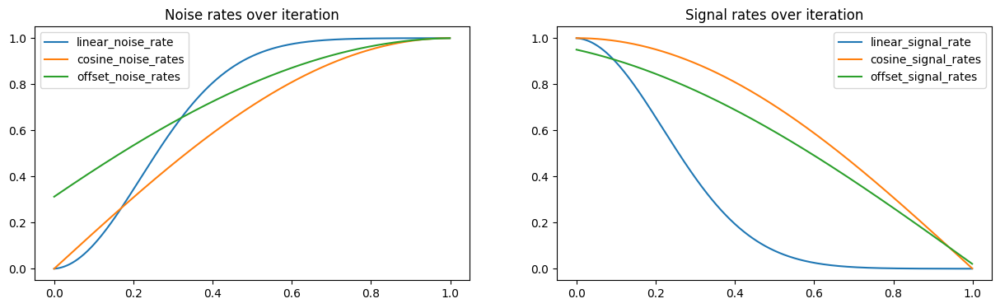

In [17]:
T = 1000
diffusion_times = [x/T for x in range(T)]
linear_noise_rates, linear_signal_rates = linear_diffusion_schedule(diffusion_times)

cosine_noise_rates, cosine_signal_rates = cosine_diffusion_schedule(diffusion_times)

offset_noise_rates, offset_signal_rates = offset_cosine_diffusion_schedule(diffusion_times)
fig, ax = plt.subplots(1, 2, figsize=(15,4))
ax[0].plot(diffusion_times, linear_noise_rates, label="linear_noise_rate")
ax[1].plot(diffusion_times, linear_signal_rates, label="linear_signal_rate")
ax[0].plot(diffusion_times, cosine_noise_rates, label="cosine_noise_rates")
ax[1].plot(diffusion_times, cosine_signal_rates, label="cosine_signal_rates")
ax[0].plot(diffusion_times, offset_noise_rates, label="offset_noise_rates")
ax[1].plot(diffusion_times, offset_signal_rates, label="offset_signal_rates")

ax[0].set_title("Noise rates over iteration")
ax[1].set_title("Signal rates over iteration")

ax[0].legend()
ax[1].legend()
plt.show()

In [18]:
noise = tf.random.normal(shape=(IMG_SIZE, IMG_SIZE, 3))

In [19]:
def apply_noise(image, noise, noise_rate, signal_rate):
    image = image * 2 - 1

    scaled_image = image * signal_rate
    scaled_noise = noise * noise_rate

    scalled_img = scaled_image + scaled_noise

    return tf.clip_by_value(scalled_img * .5 + .5, 0, 1)

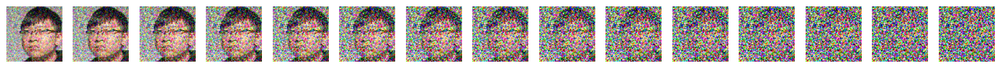

In [46]:
T = 15
diffusion_times = [x/T for x in range(T)]
offset_noise_rates, offset_signal_rates = offset_cosine_diffusion_schedule(diffusion_times)

images = [apply_noise(img[2], noise, noise_, signal_) for noise_, signal_ in zip(offset_noise_rates, offset_signal_rates)]

fig, ax = plt.subplots(1, T, figsize = (20, 20))

for ax_i, _img in zip(ax, images):
    ax_i.imshow(_img)
    ax_i.axis("off")

plt.show()

## UNet model

### Let's build our elementary blocks

- ResidualBlock
- DownBlock
- UpBlock

In [21]:
from tensorflow.keras import layers, activations, models, optimizers, losses, metrics, callbacks

### Residual Block

In [22]:
def ResidualBlock(width):
    def apply(x):
        input_width = x.shape[3]
        if input_width == width:
            residual = x
        else :
            residual = layers.Conv2D(width, kernel_size=1)(x)

        x = layers.BatchNormalization(center=False, scale=False)(x)
        x = layers.Conv2D(width, kernel_size=3, padding="same", activation=activations.swish)(x)
        x = layers.Conv2D(width, kernel_size=3, padding="same")(x)
        x = layers.Add()([x, residual])
        return x

    return apply

### DownBlock

In [23]:
def DownBlock(width, block_depth):
    def apply(x):
        x, skips = x
        for _ in range(block_depth):
            x = ResidualBlock(width)(x)
            skips.append(x)
        x = layers.AveragePooling2D(pool_size=2)(x)
        return x

    return apply

### UpBlock

In [24]:
def UpBlock(width, block_depth):
    def apply(x):
        x, skips = x
        x = layers.UpSampling2D(size=2, interpolation='bilinear')(x)
        for _ in range(block_depth):
            x = layers.Concatenate()([x, skips.pop()])
            x = ResidualBlock(width)(x)
        return x

    return apply

### sinusoidal embedding

In [25]:
def sinusoidal_embedding(x):
    frequencies = tf.exp(
        tf.linspace(
            tf.math.log(1.0),
            tf.math.log(1000.0),
            16,
        )
    )

    angular_speeds = 2.0 * tf.constant(math.pi) * frequencies
    embeddings = tf.concat([
        tf.sin(angular_speeds * x), tf.cos(angular_speeds * x)
            ],
                           axis=3)

    return embeddings

In [26]:
noisy_images = layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3))
x = layers.Conv2D(32, kernel_size=1)(noisy_images)

noise_variances = layers.Input(shape=(1, 1, 1))
noise_embedding = layers.Lambda(sinusoidal_embedding)(noise_variances)
noise_embedding = layers.UpSampling2D(size=IMG_SIZE, interpolation="nearest")(
    noise_embedding
)

x = layers.Concatenate()([x, noise_embedding])

skips = []

x = DownBlock(32, block_depth=2)([x, skips])
x = DownBlock(64, block_depth=2)([x, skips])
x = DownBlock(96, block_depth=2)([x, skips])
x = DownBlock(128, block_depth=2)([x, skips])


x = ResidualBlock(128)(x)
x = ResidualBlock(128)(x)

x = UpBlock(128,  block_depth=2)([x, skips])
x = UpBlock(96,  block_depth=2)([x, skips])
x = UpBlock(64,  block_depth=2)([x, skips])
x = UpBlock(32,  block_depth=2)([x, skips])

x = layers.Conv2D(3, kernel_size=1, kernel_initializer="zeros")(x)

unet = models.Model([noisy_images, noise_variances], x, name="unet")




In [27]:
class DiffusionModel(models.Model):
    def __init__(self):
        super().__init__()

        self.normalizer = layers.Normalization()
        self.network = unet
        self.ema_network = models.clone_model(self.network)
        self.diffusion_schedule = offset_cosine_diffusion_schedule

    def compile(self, **kwargs):
        super().compile(**kwargs)
        self.noise_loss_tracker = metrics.Mean(name="n_loss")

    @property
    def metrics(self):
        return [self.noise_loss_tracker]

    def denormalize(self, images):
        images = self.normalizer.mean + images * self.normalizer.variance**0.5
        return tf.clip_by_value(images, 0.0, 1.0)

    def denoise(self, noisy_images, noise_rates, signal_rates, training):
        if training:
            network = self.network
        else:
            network = self.ema_network
        pred_noises = network(
            [noisy_images, noise_rates**2], training=training
        )
        pred_images = (noisy_images - noise_rates * pred_noises) / signal_rates

        return pred_noises, pred_images

    def reverse_diffusion(self, initial_noise, diffusion_steps):
        num_images = initial_noise.shape[0]
        step_size = 1.0 / diffusion_steps
        current_images = initial_noise
        for step in range(diffusion_steps):
            diffusion_times = tf.ones((num_images, 1, 1, 1)) - step * step_size
            noise_rates, signal_rates = self.diffusion_schedule(diffusion_times)
            pred_noises, pred_images = self.denoise(
                current_images, noise_rates, signal_rates, training=False
            )
            next_diffusion_times = diffusion_times - step_size
            next_noise_rates, next_signal_rates = self.diffusion_schedule(
                next_diffusion_times
            )
            current_images = (
                next_signal_rates * pred_images + next_noise_rates * pred_noises
            )
        return pred_images

    def generate(self, num_images, diffusion_steps, initial_noise=None):
        if initial_noise is None:
            initial_noise = tf.random.normal(
                shape=(num_images, IMG_SIZE, IMG_SIZE, 3)
            )
        generated_images = self.reverse_diffusion(
            initial_noise, diffusion_steps
        )
        generated_images = self.denormalize(generated_images)
        return generated_images

    def train_step(self, images):
        images = self.normalizer(images, training=True)
        noises = tf.random.normal(shape=(BATCH_SIZE, IMG_SIZE, IMG_SIZE, 3))

        diffusion_times = tf.random.uniform(
            shape=(BATCH_SIZE, 1, 1, 1), minval=0.0, maxval=1.0
        )
        noise_rates, signal_rates = self.diffusion_schedule(diffusion_times)

        noisy_images = signal_rates * images + noise_rates * noises

        with tf.GradientTape() as tape:
            # train the network to separate noisy images to their components
            pred_noises, pred_images = self.denoise(
                noisy_images, noise_rates, signal_rates, training=True
            )

            noise_loss = self.loss(noises, pred_noises)  # used for training

        gradients = tape.gradient(noise_loss, self.network.trainable_weights)
        self.optimizer.apply_gradients(
            zip(gradients, self.network.trainable_weights)
        )

        self.noise_loss_tracker.update_state(noise_loss)

        for weight, ema_weight in zip(
            self.network.weights, self.ema_network.weights
        ):
            ema_weight.assign(EMA * ema_weight + (1 - EMA) * weight)

        return {m.name: m.result() for m in self.metrics}

    def test_step(self, images):
        images = self.normalizer(images, training=False)
        noises = tf.random.normal(shape=(BATCH_SIZE, IMG_SIZE, IMG_SIZE, 3))
        diffusion_times = tf.random.uniform(
            shape=(BATCH_SIZE, 1, 1, 1), minval=0.0, maxval=1.0
        )
        noise_rates, signal_rates = self.diffusion_schedule(diffusion_times)
        noisy_images = signal_rates * images + noise_rates * noises
        pred_noises, pred_images = self.denoise(
            noisy_images, noise_rates, signal_rates, training=False
        )
        noise_loss = self.loss(noises, pred_noises)
        self.noise_loss_tracker.update_state(noise_loss)

        return {m.name: m.result() for m in self.metrics}

In [47]:
ddm = DiffusionModel()
ddm.normalizer.adapt(dataset)

In [ ]:
LOAD_FROM_CHECK_POINT = False

if LOAD_FROM_CHECK_POINT:
    pass

# Train the model

In [48]:
ddm.compile(
    optimizer=optimizers.experimental.AdamW(
        learning_rate=LEARNING_RATE, weight_decay=WEIGHT_DECAY
    ),
    loss=losses.mean_absolute_error,
)

In [49]:
from IPython import display

Epoch 1/25
  6/812 [..............................] - ETA: 55s - n_loss: 0.2007

812/812 [==============================] - ETA: 0s - n_loss: 0.1598

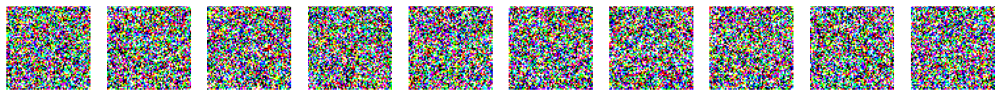

812/812 [==============================] - 97s 99ms/step - n_loss: 0.1598 - lr: 0.0010
Epoch 2/25
812/812 [==============================] - ETA: 0s - n_loss: 0.1562

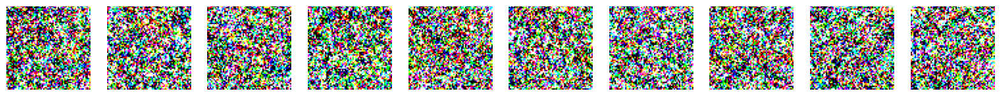

812/812 [==============================] - 84s 102ms/step - n_loss: 0.1562 - lr: 0.0010
Epoch 3/25
812/812 [==============================] - ETA: 0s - n_loss: 0.1533

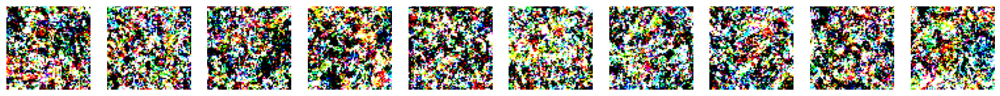

812/812 [==============================] - 84s 102ms/step - n_loss: 0.1533 - lr: 0.0010
Epoch 4/25
812/812 [==============================] - ETA: 0s - n_loss: 0.1521

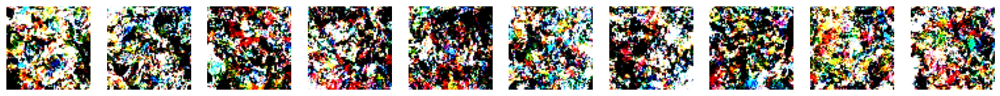

812/812 [==============================] - 86s 104ms/step - n_loss: 0.1521 - lr: 0.0010
Epoch 5/25
812/812 [==============================] - ETA: 0s - n_loss: 0.1506

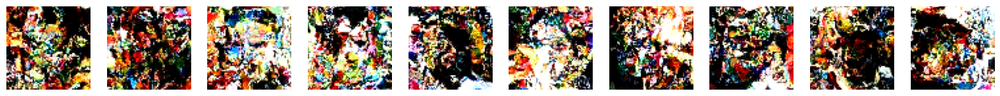

812/812 [==============================] - 88s 106ms/step - n_loss: 0.1506 - lr: 0.0010
Epoch 6/25
812/812 [==============================] - ETA: 0s - n_loss: 0.1497

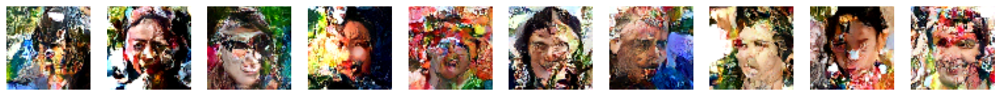

812/812 [==============================] - 89s 108ms/step - n_loss: 0.1497 - lr: 0.0010
Epoch 7/25
812/812 [==============================] - ETA: 0s - n_loss: 0.1496

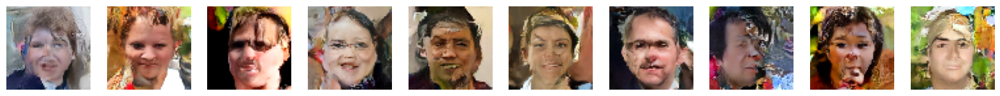

812/812 [==============================] - 89s 108ms/step - n_loss: 0.1496 - lr: 0.0010
Epoch 8/25
812/812 [==============================] - ETA: 0s - n_loss: 0.1486

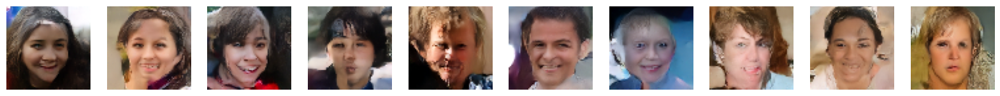

812/812 [==============================] - 89s 108ms/step - n_loss: 0.1486 - lr: 0.0010
Epoch 9/25
812/812 [==============================] - ETA: 0s - n_loss: 0.1490

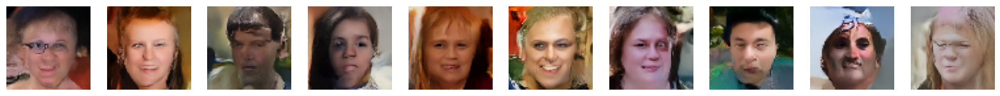

812/812 [==============================] - 89s 108ms/step - n_loss: 0.1490 - lr: 0.0010
Epoch 10/25
812/812 [==============================] - ETA: 0s - n_loss: 0.1489

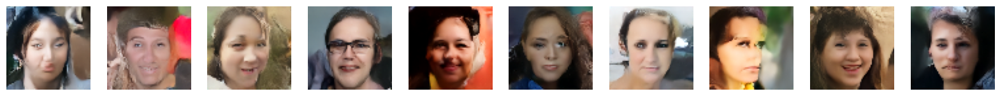

812/812 [==============================] - 89s 108ms/step - n_loss: 0.1489 - lr: 0.0010
Epoch 11/25
812/812 [==============================] - ETA: 0s - n_loss: 0.1475

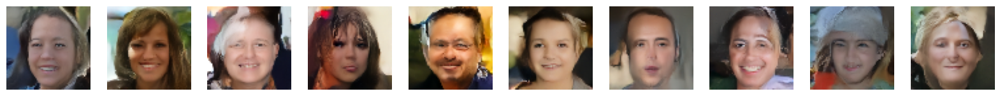

812/812 [==============================] - 89s 108ms/step - n_loss: 0.1475 - lr: 0.0010
Epoch 12/25
812/812 [==============================] - ETA: 0s - n_loss: 0.1468

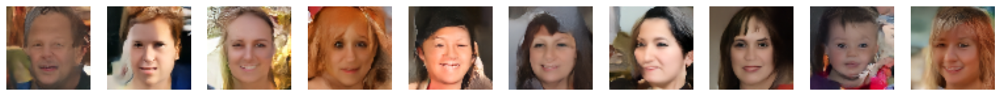

812/812 [==============================] - 91s 109ms/step - n_loss: 0.1468 - lr: 0.0010
Epoch 13/25
812/812 [==============================] - ETA: 0s - n_loss: 0.1476

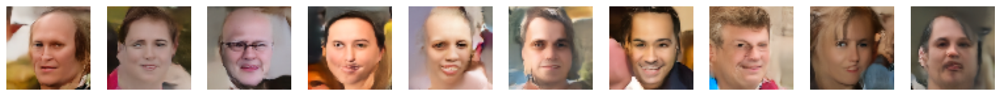

812/812 [==============================] - 91s 110ms/step - n_loss: 0.1476 - lr: 0.0010
Epoch 14/25
812/812 [==============================] - ETA: 0s - n_loss: 0.1470

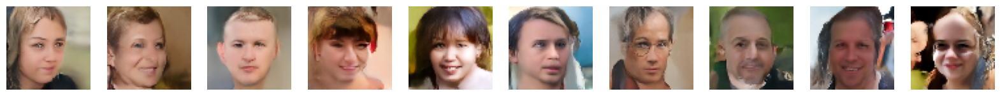

812/812 [==============================] - 92s 111ms/step - n_loss: 0.1470 - lr: 0.0010
Epoch 15/25
812/812 [==============================] - ETA: 0s - n_loss: 0.1467

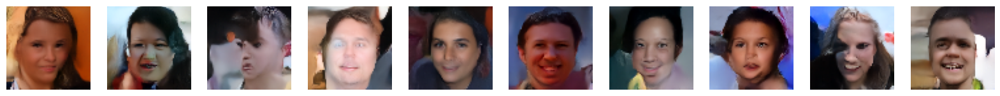

812/812 [==============================] - 91s 111ms/step - n_loss: 0.1467 - lr: 0.0010
Epoch 16/25
812/812 [==============================] - ETA: 0s - n_loss: 0.1465

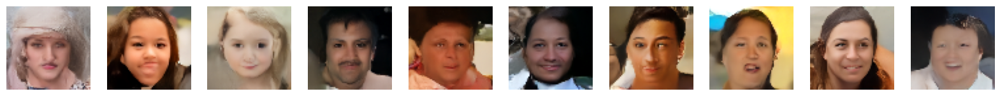

812/812 [==============================] - 93s 113ms/step - n_loss: 0.1465 - lr: 0.0010
Epoch 17/25
812/812 [==============================] - ETA: 0s - n_loss: 0.1465

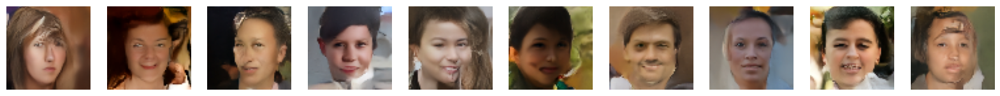

812/812 [==============================] - 92s 112ms/step - n_loss: 0.1465 - lr: 0.0010
Epoch 18/25
812/812 [==============================] - ETA: 0s - n_loss: 0.1461

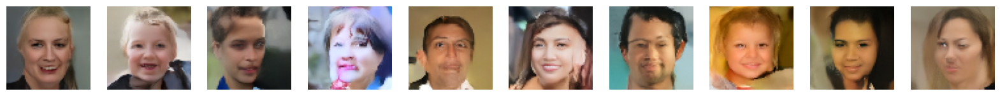

812/812 [==============================] - 93s 113ms/step - n_loss: 0.1461 - lr: 0.0010
Epoch 19/25
812/812 [==============================] - ETA: 0s - n_loss: 0.1456

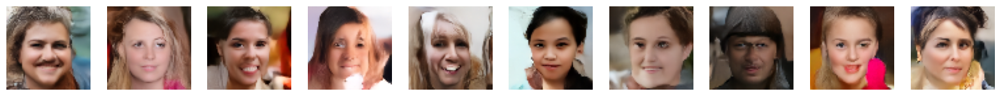

812/812 [==============================] - 93s 113ms/step - n_loss: 0.1456 - lr: 0.0010
Epoch 20/25
812/812 [==============================] - ETA: 0s - n_loss: 0.1458

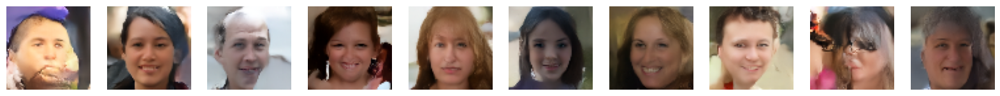

812/812 [==============================] - 93s 113ms/step - n_loss: 0.1458 - lr: 0.0010
Epoch 21/25
812/812 [==============================] - ETA: 0s - n_loss: 0.1458

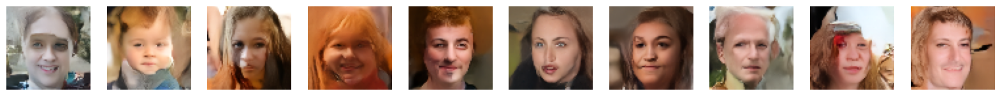

812/812 [==============================] - 94s 114ms/step - n_loss: 0.1458 - lr: 0.0010
Epoch 22/25
812/812 [==============================] - ETA: 0s - n_loss: 0.1455

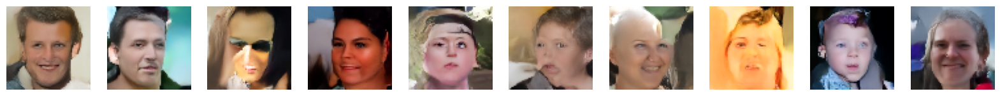

812/812 [==============================] - 94s 114ms/step - n_loss: 0.1455 - lr: 0.0010
Epoch 23/25
812/812 [==============================] - ETA: 0s - n_loss: 0.1453

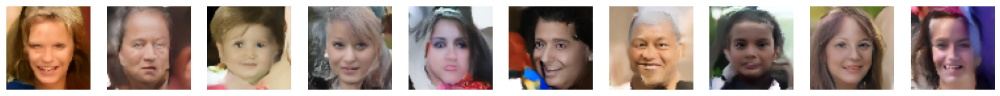

812/812 [==============================] - 95s 116ms/step - n_loss: 0.1453 - lr: 0.0010
Epoch 24/25
812/812 [==============================] - ETA: 0s - n_loss: 0.1451

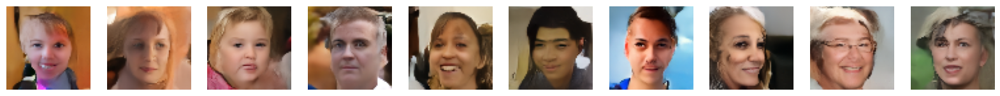

812/812 [==============================] - 94s 114ms/step - n_loss: 0.1451 - lr: 0.0010
Epoch 25/25
812/812 [==============================] - ETA: 0s - n_loss: 0.1452

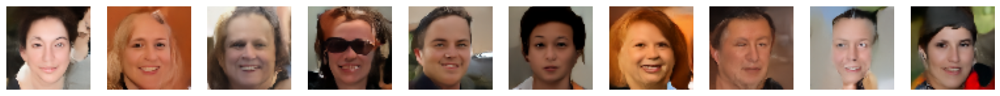

812/812 [==============================] - 96s 116ms/step - n_loss: 0.1452 - lr: 0.0010


In [50]:
path = '/content/drive/MyDrive/Datascience/diffusion/ffhq'

model_checkpoint_callback = callbacks.ModelCheckpoint(
    filepath=f"{path}/checkpoint/checkpoint.ckpt",
    save_weights_only=True,
    save_freq="epoch",
    verbose=0,
)

tensorboard_callback = callbacks.TensorBoard(log_dir=f"{path}/logs")


class ImageGenerator(callbacks.Callback):
    def __init__(self, num_img):
        self.num_img = num_img

    def on_epoch_end(self, epoch, logs=None):
        generated_images = self.model.generate(
            num_images=self.num_img,
            diffusion_steps=PLOT_DIFFUSION_STEPS,
        ).numpy()

        fig, ax = plt.subplots(1, len(generated_images), figsize=(20,20))

        for _img, ax_i in zip(generated_images, ax):
            ax_i.imshow(_img)
            ax_i.axis('off')

        plt.show()

reduce_lr = callbacks.ReduceLROnPlateau(monitor="n_loss", patience=5, factor=0.2)



image_generator_callback = ImageGenerator(num_img=10)

ddm.fit(
    dataset,
    epochs=EPOCHS,
    callbacks=[
        model_checkpoint_callback,
        tensorboard_callback,
        image_generator_callback,
        reduce_lr
    ],
)

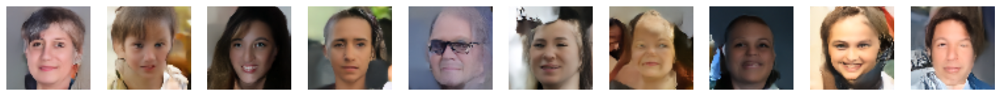

In [51]:
# Generate some novel images of faces
generated_images = ddm.generate(num_images=10, diffusion_steps=20).numpy()

fig, ax = plt.subplots(1, len(generated_images), figsize=(20,20))

for _img, ax_i in zip(generated_images, ax):
    ax_i.imshow(_img)
    ax_i.axis('off')

plt.show()

In [52]:
import numpy as np

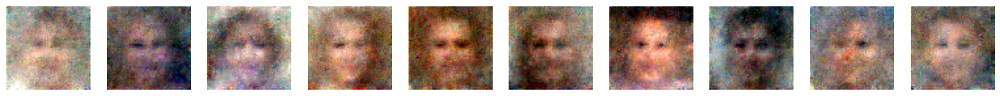

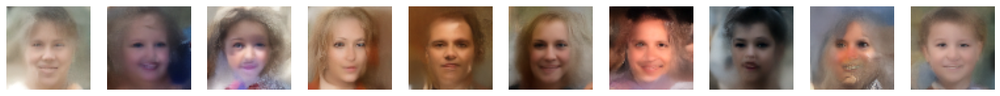

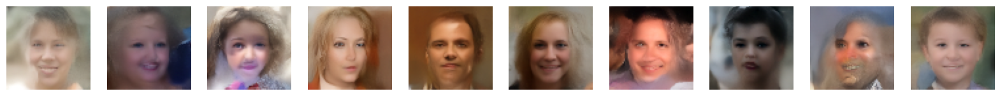

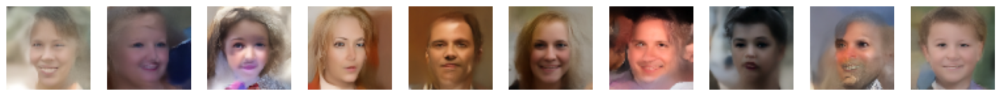

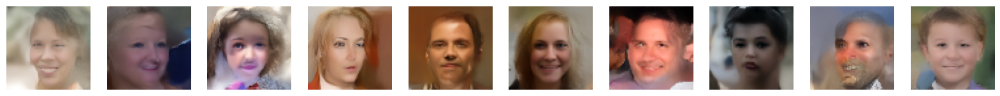

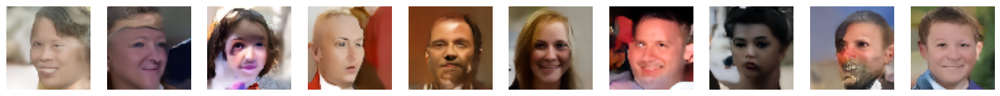

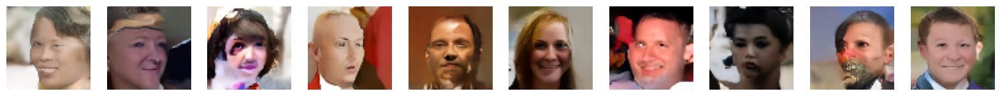

In [56]:
# View improvement over greater number of diffusion steps
for diffusion_steps in list(np.arange(1, 6, 1)) + [20] + [50]:
    tf.random.set_seed(42)
    generated_images = ddm.generate(
        num_images=10,
        diffusion_steps=diffusion_steps,
    ).numpy()
    fig, ax = plt.subplots(1, len(generated_images), figsize=(20,20))

    for _img, ax_i in zip(generated_images, ax):
        ax_i.imshow(_img)
        ax_i.axis('off')

    plt.show()

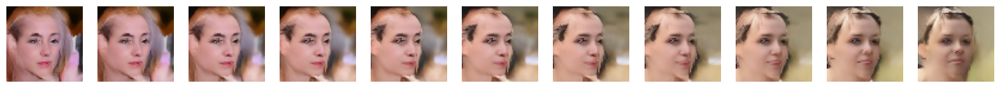

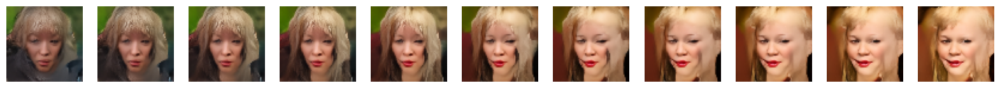

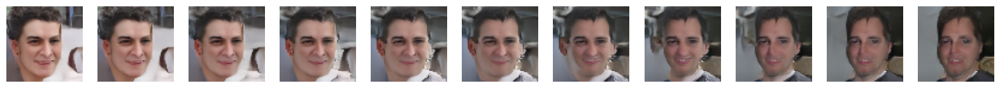

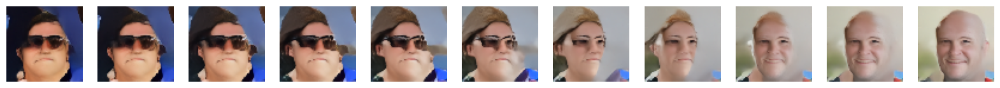

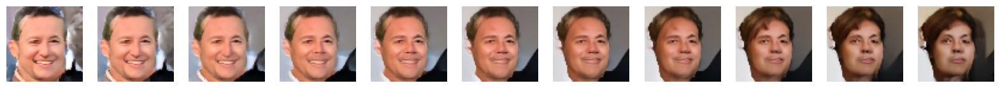

In [54]:
# Interpolation between two points in the latent space
tf.random.set_seed(25987)


def spherical_interpolation(a, b, t):
    return np.sin(t * math.pi / 2) * a + np.cos(t * math.pi / 2) * b


for i in range(5):
    a = tf.random.normal(shape=(IMG_SIZE, IMG_SIZE, 3))
    b = tf.random.normal(shape=(IMG_SIZE, IMG_SIZE, 3))
    initial_noise = np.array(
        [spherical_interpolation(a, b, t) for t in np.arange(0, 1.1, 0.1)]
    )
    generated_images = ddm.generate(
        num_images=2, diffusion_steps=50, initial_noise=initial_noise
    ).numpy()

    fig, ax = plt.subplots(1, len(generated_images), figsize=(20,20))

    for _img, ax_i in zip(generated_images, ax):
        ax_i.imshow(_img)
        ax_i.axis('off')

    plt.show()